1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading the rain dataset
df = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [5]:
df.shape

(8425, 23)

In [6]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

<Axes: >

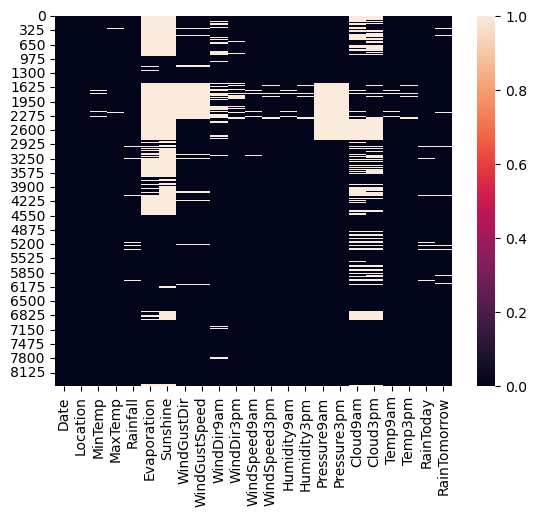

In [8]:
sns.heatmap(df.isnull())

In [9]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [10]:
#We have a lot of null values in the combined dataset - attempting to handle null values

# Drop columns with more than 50% missing values
threshold = len(df) * 0.5
df.dropna(thresh=threshold, axis=1, inplace=True)

# Fill numerical columns with mean
for col in df.select_dtypes(include=['float64', 'int64']).columns:
    df[col].fillna(df[col].mean(), inplace=True)

# Fill categorical columns with mode
for col in df.select_dtypes(include=['object']).columns:
    df[col].fillna(df[col].mode()[0], inplace=True)

In [11]:
#Verifying null and missing values after handling null values
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

There are no null values in the dataset

In [12]:
#Checking for duplicated rows
print ("Total Duplicate rows are: ",df.duplicated().sum())

Total Duplicate rows are:  1663


In [13]:
# Remove duplicate rows
df = df.drop_duplicates()

In [14]:
#Verify duplicate rows still exist after removing duplicate rows
print ("Total Duplicate rows are: ",df.duplicated().sum())

Total Duplicate rows are:  0


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6762 non-null   object 
 1   Location       6762 non-null   object 
 2   MinTemp        6762 non-null   float64
 3   MaxTemp        6762 non-null   float64
 4   Rainfall       6762 non-null   float64
 5   Evaporation    6762 non-null   float64
 6   Sunshine       6762 non-null   float64
 7   WindGustDir    6762 non-null   object 
 8   WindGustSpeed  6762 non-null   float64
 9   WindDir9am     6762 non-null   object 
 10  WindDir3pm     6762 non-null   object 
 11  WindSpeed9am   6762 non-null   float64
 12  WindSpeed3pm   6762 non-null   float64
 13  Humidity9am    6762 non-null   float64
 14  Humidity3pm    6762 non-null   float64
 15  Pressure9am    6762 non-null   float64
 16  Pressure3pm    6762 non-null   float64
 17  Cloud9am       6762 non-null   float64
 18  Cloud3pm

In [16]:
#checking number of unique values in each column
df.nunique().to_frame("No. of unique values")

,No. of unique values
Date,3004
Location,12
MinTemp,286
MaxTemp,332
Rainfall,251
Evaporation,117
Sunshine,141
WindGustDir,16
WindGustSpeed,53
WindDir9am,16


These are the unique values present in the dataset, we need to remove unnecessary columns

In [17]:
#Dropping Unnecessary Columns
df.drop("Date",axis = 1, inplace = True)

In [18]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110016,24.096335,2.780674,5.339977,7.767098,39.144388,12.792133,17.585384,67.509082,50.478258,1017.629004,1015.142442,4.400224,4.372235,17.894035,22.704947
std,5.540673,6.130161,10.482770,3.343991,2.736693,13.382876,9.788112,9.549341,17.182723,18.498573,6.027916,5.967815,2.476781,2.324720,5.722423,5.971925
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.000000,7.632205,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.193305,23.500000,0.000000,5.389395,7.632205,39.000000,11.000000,17.000000,68.000000,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.900000,22.300000
75%,17.400000,28.400000,1.200000,5.389395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


From the statistical summary, We can observe the following

The counts of all columns are the same,
there is no missing values in the dataset 
The median(50%) is almost equal to the mean in most columns,  this means that the data is symmetric and there is little to no skewness. 
There is a huge diference between 75% and max meaning there are outliers present in the dataset.
We can also notice the standard deviation,min and 25% percentile values

Univariate Analysis

No     5190
Yes    1572
Name: RainToday, dtype: int64


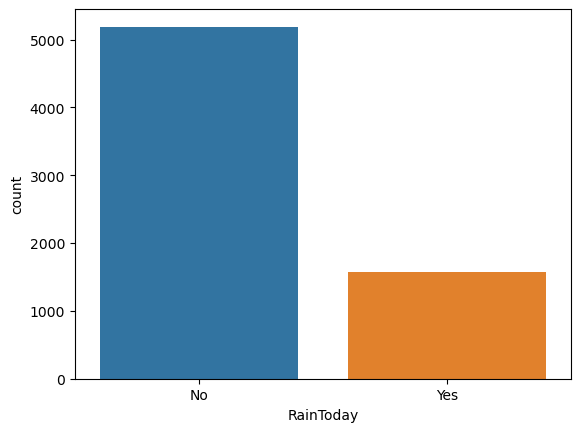

In [19]:
# Visualise the count of RainToday
ax = sns.countplot(x="RainToday",data = df)
print(df['RainToday'].value_counts())

No     5190
Yes    1572
Name: RainTomorrow, dtype: int64


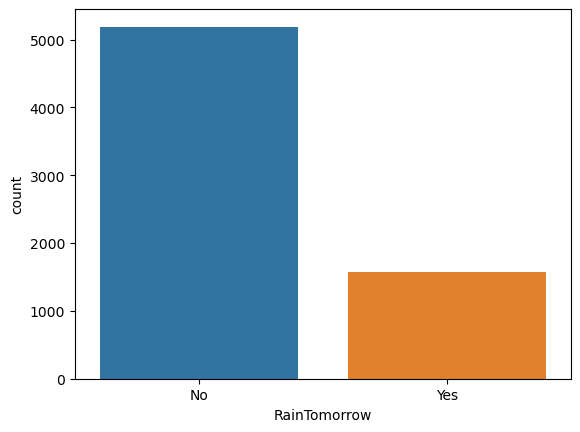

In [20]:
# Visualise the count of RainTomorrow
ax = sns.countplot(x="RainTomorrow",data = df)
print(df['RainTomorrow'].value_counts())

Bivariate Analysis

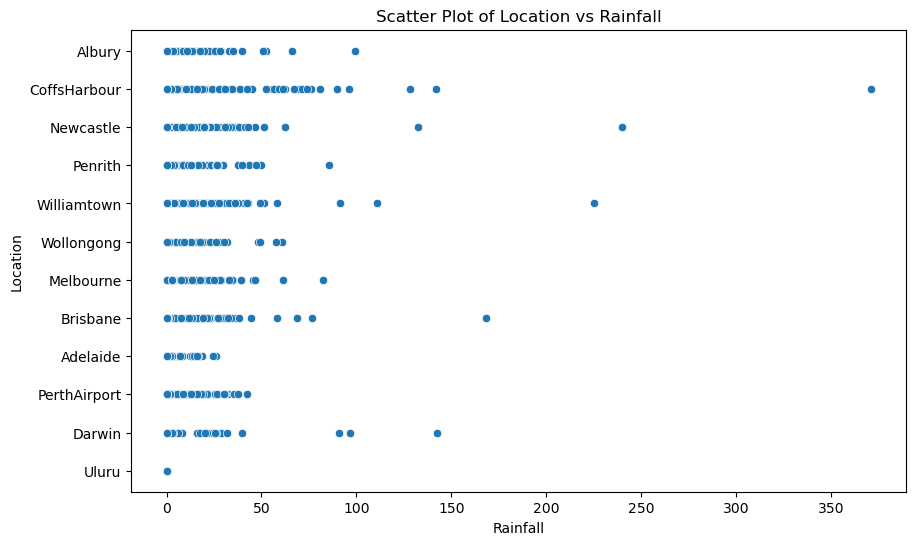

In [21]:
# Scatter plot for Location vs Rainfall
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Rainfall', y='Location', data=df)
plt.title('Scatter Plot of Location vs Rainfall')
plt.xlabel('Rainfall')
plt.ylabel('Location')
plt.show()

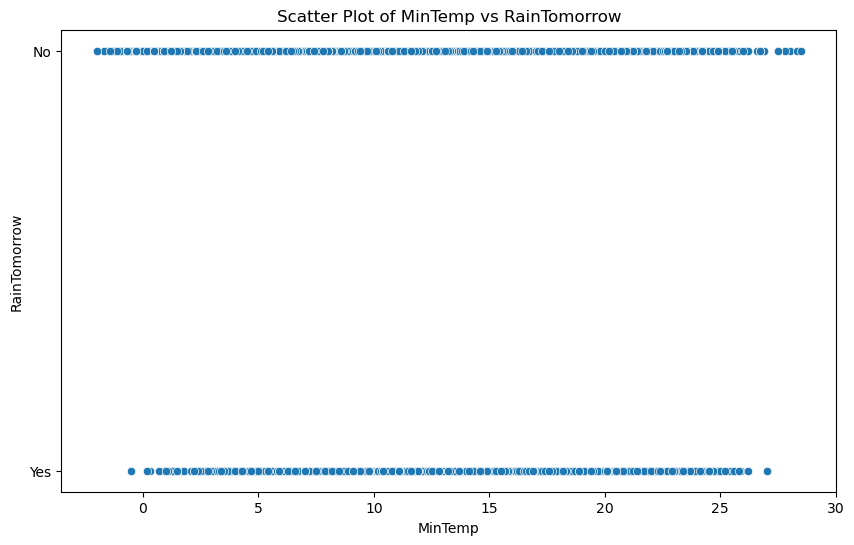

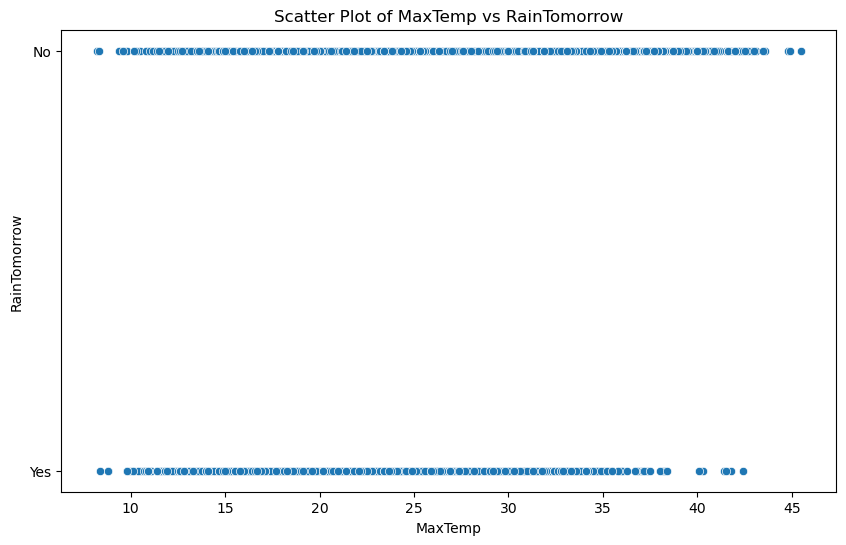

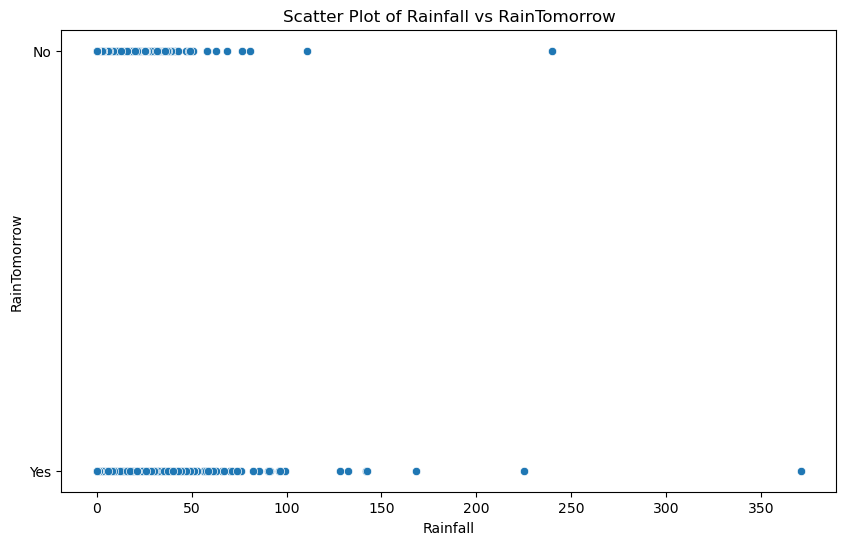

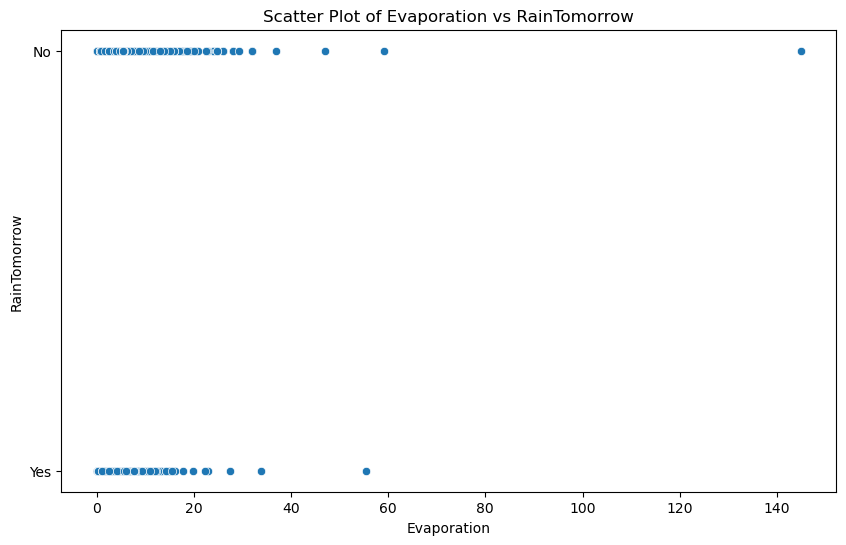

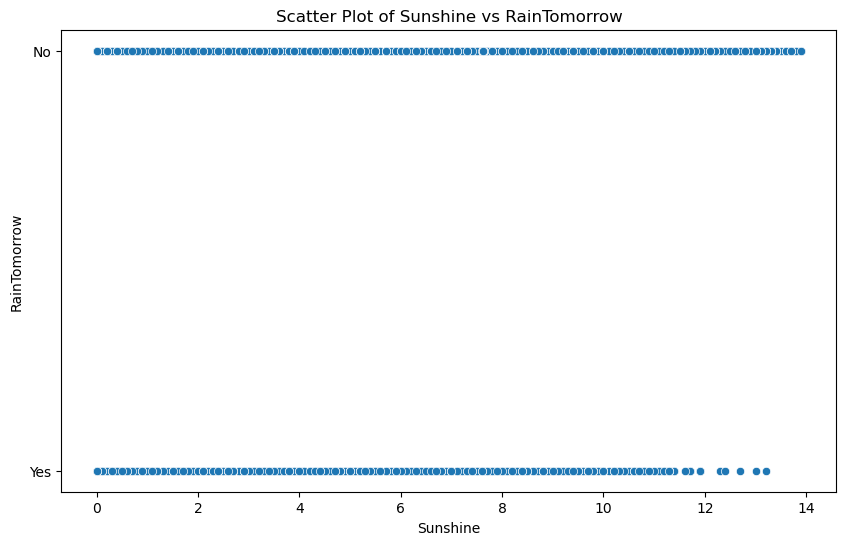

...

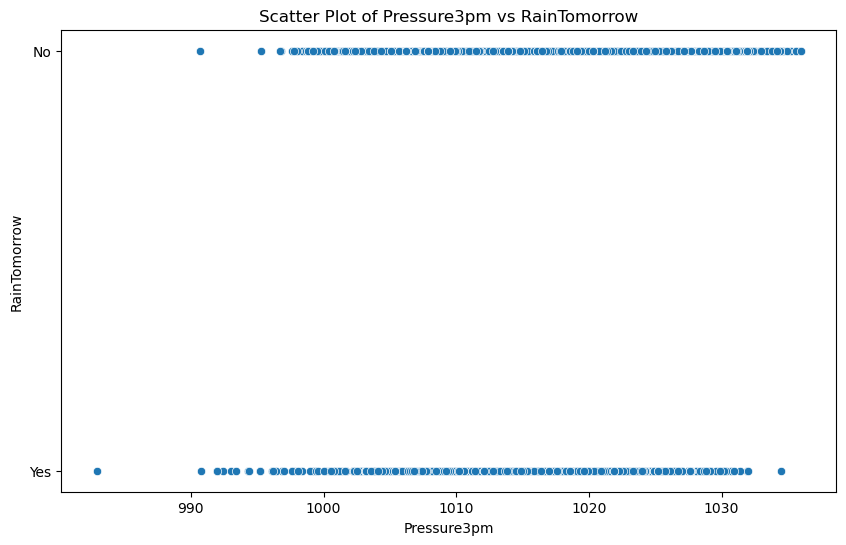

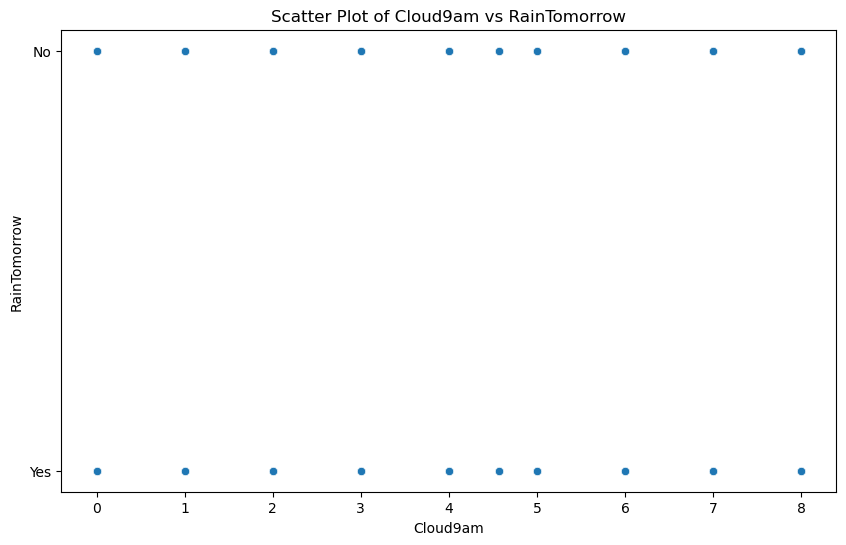

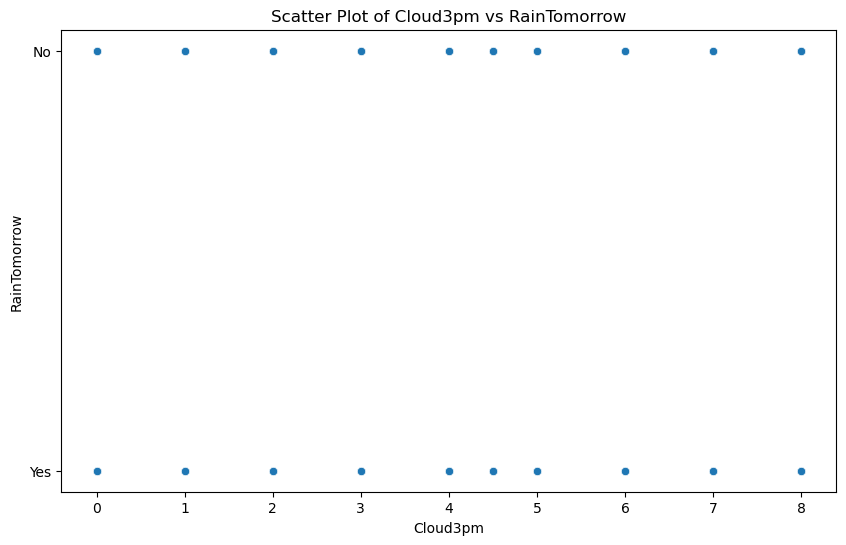

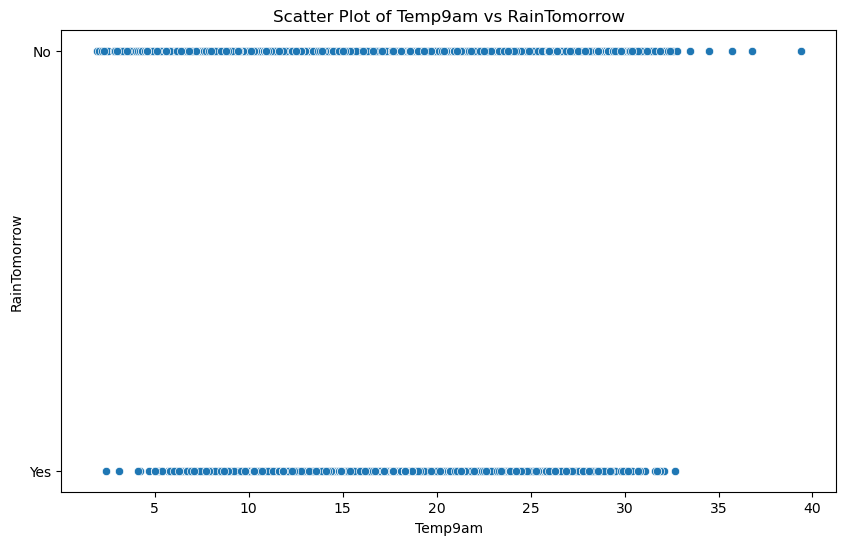

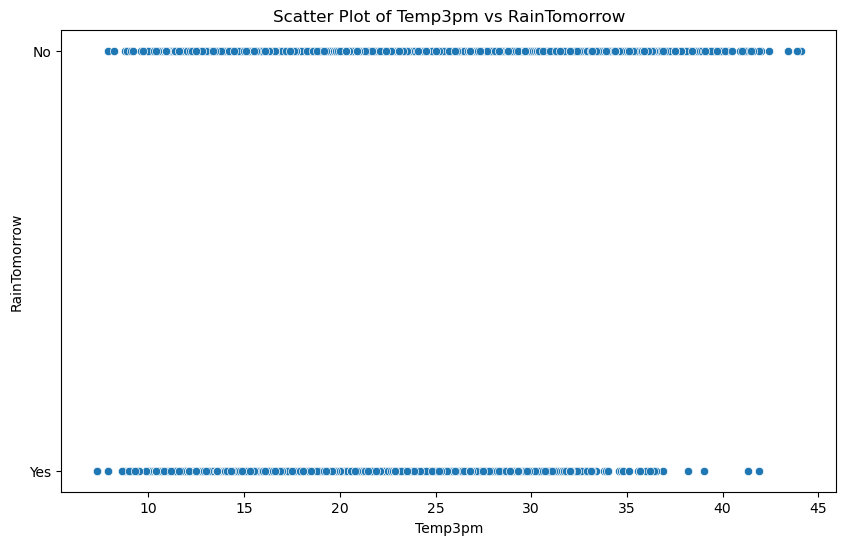

In [22]:
# Scatter plot for numerical features against the target variable
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns

for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df[feature], y=df['RainTomorrow'])
    plt.title(f'Scatter Plot of {feature} vs RainTomorrow')
    plt.show()


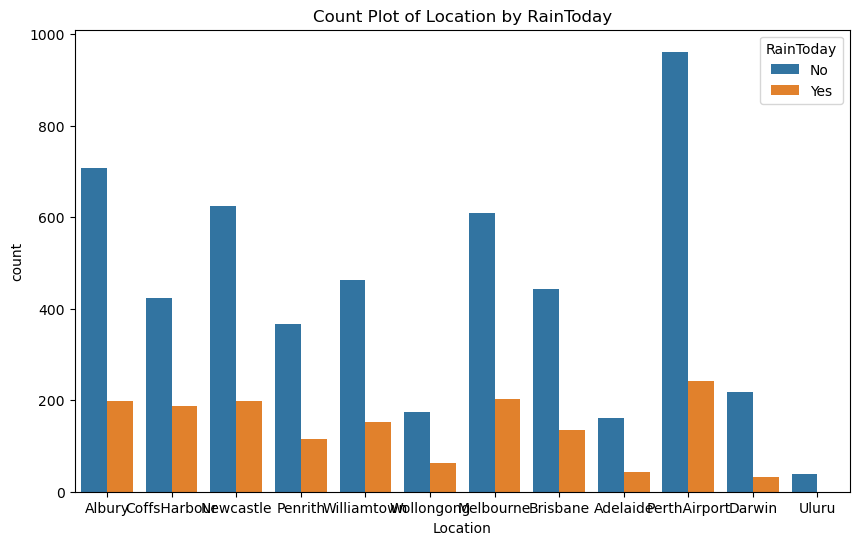

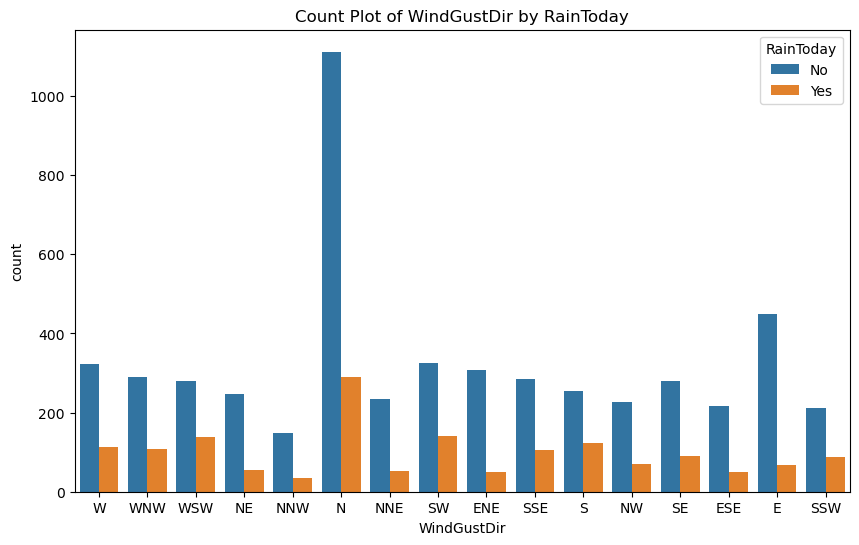

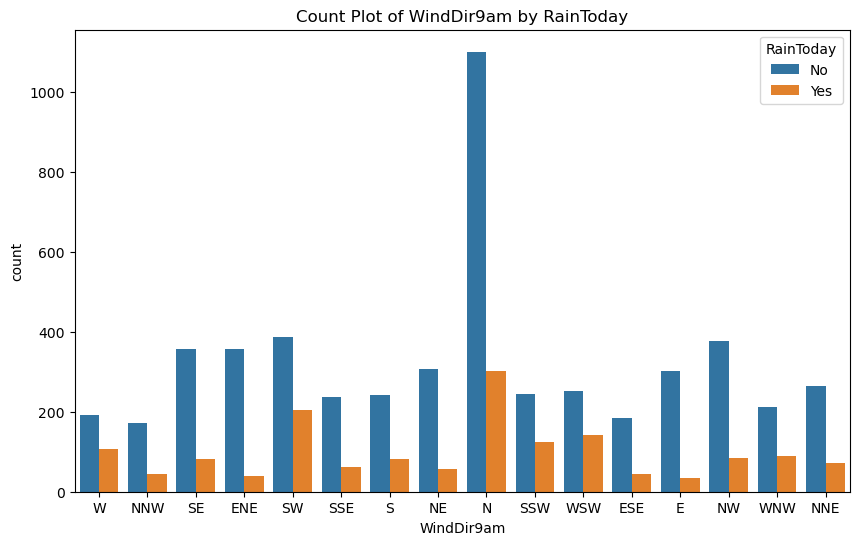

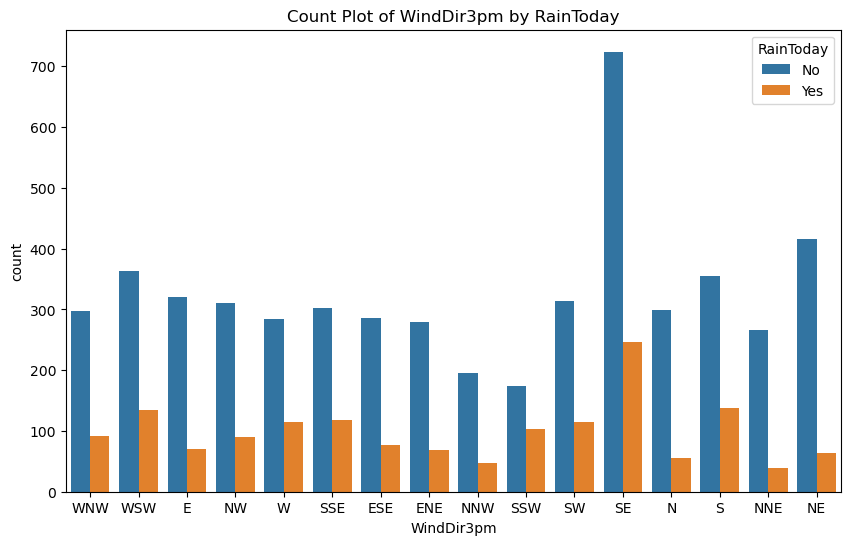

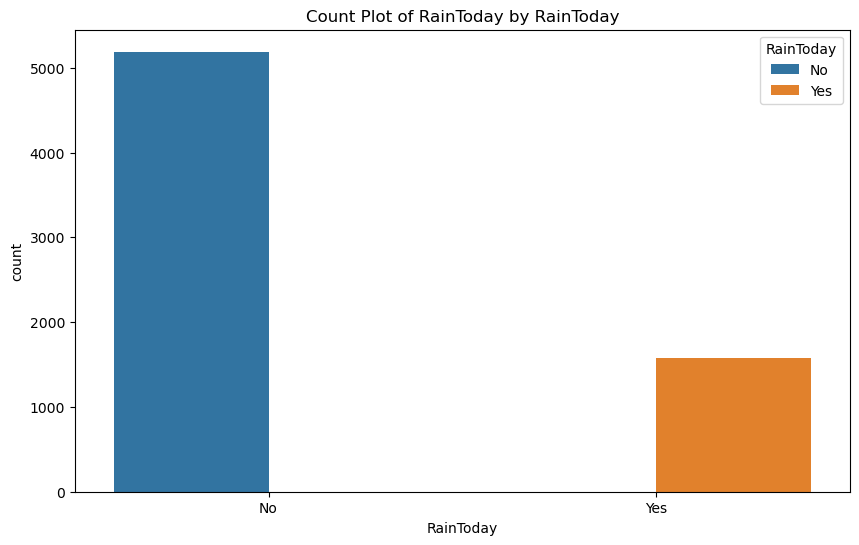

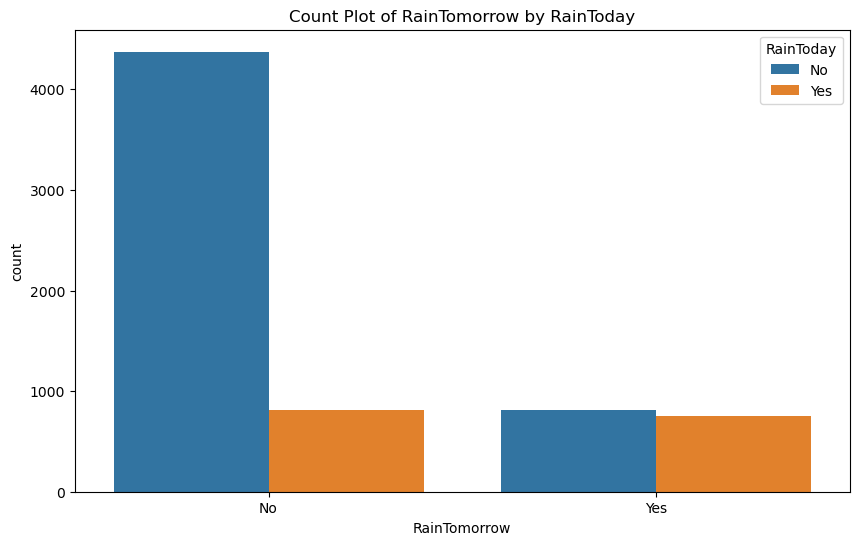

In [23]:
# Bar plot for categorical features against the target variable
categorical_features = df.select_dtypes(include=['object']).columns

for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=df[feature], hue=df['RainToday'])
    plt.title(f'Count Plot of {feature} by RainToday')
    plt.show()


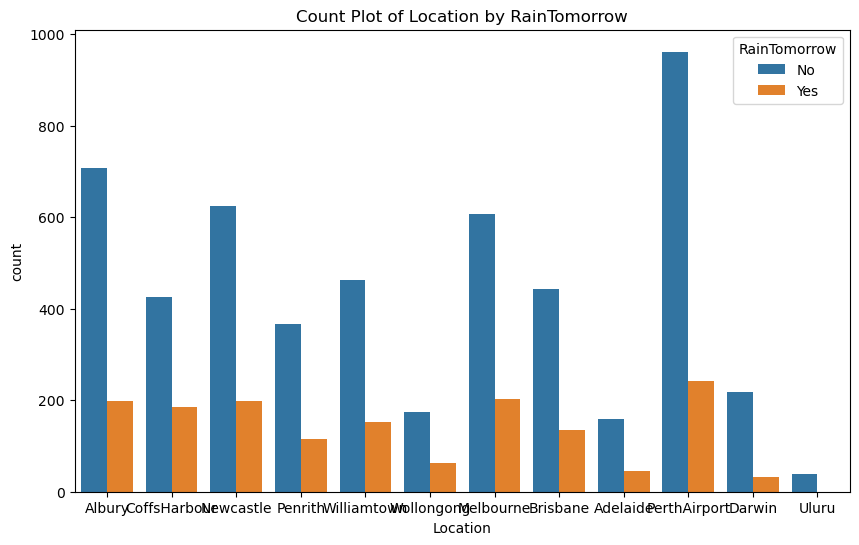

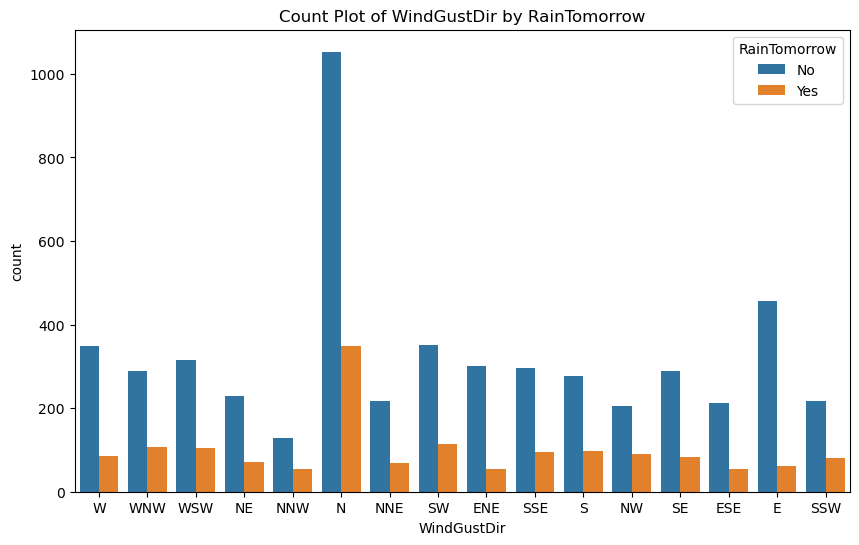

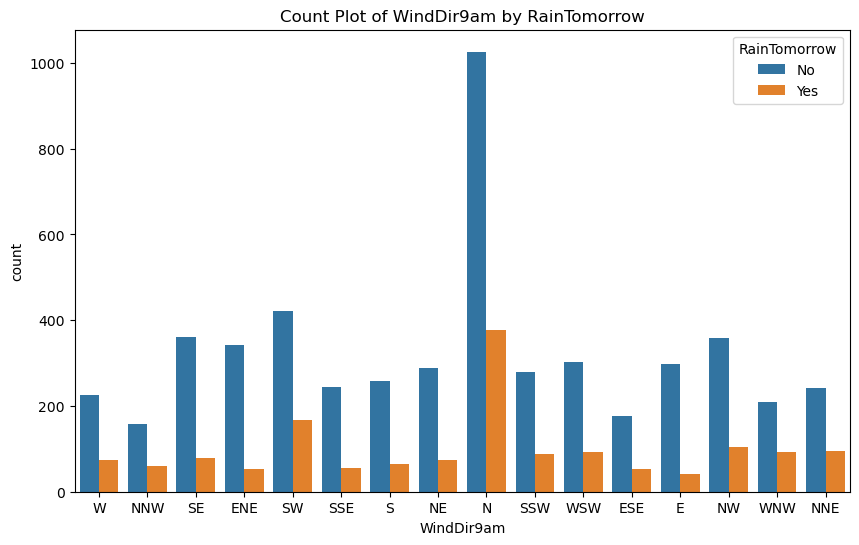

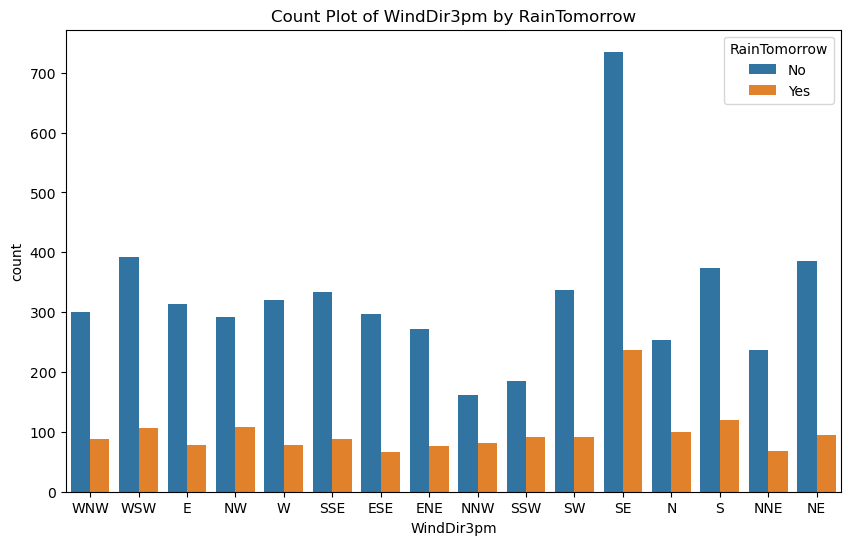

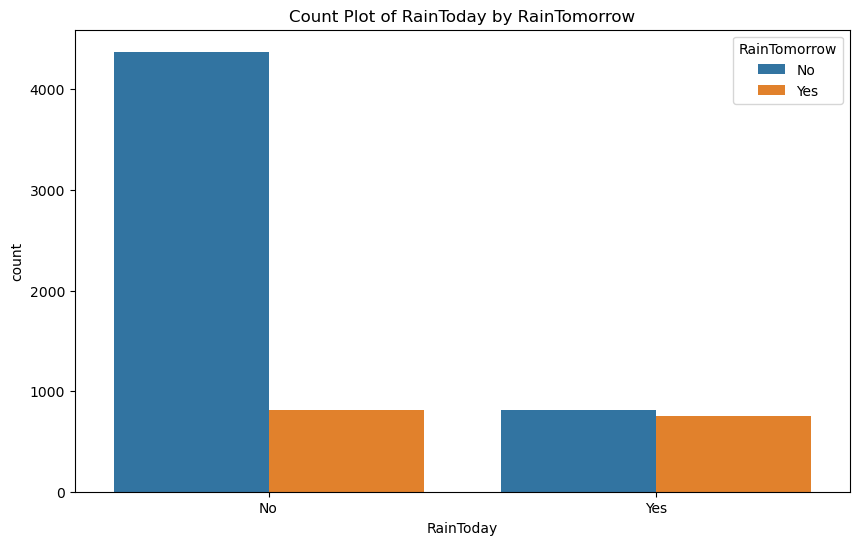

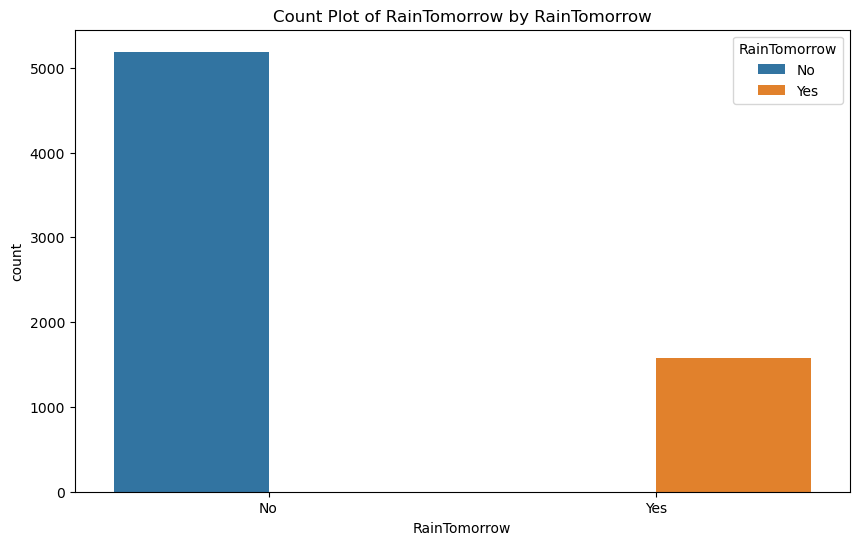

In [24]:
# Bar plot for categorical features against the target variable
categorical_features = df.select_dtypes(include=['object']).columns

for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=df[feature], hue=df['RainTomorrow'])
    plt.title(f'Count Plot of {feature} by RainTomorrow')
    plt.show()


Multivariate Analysis

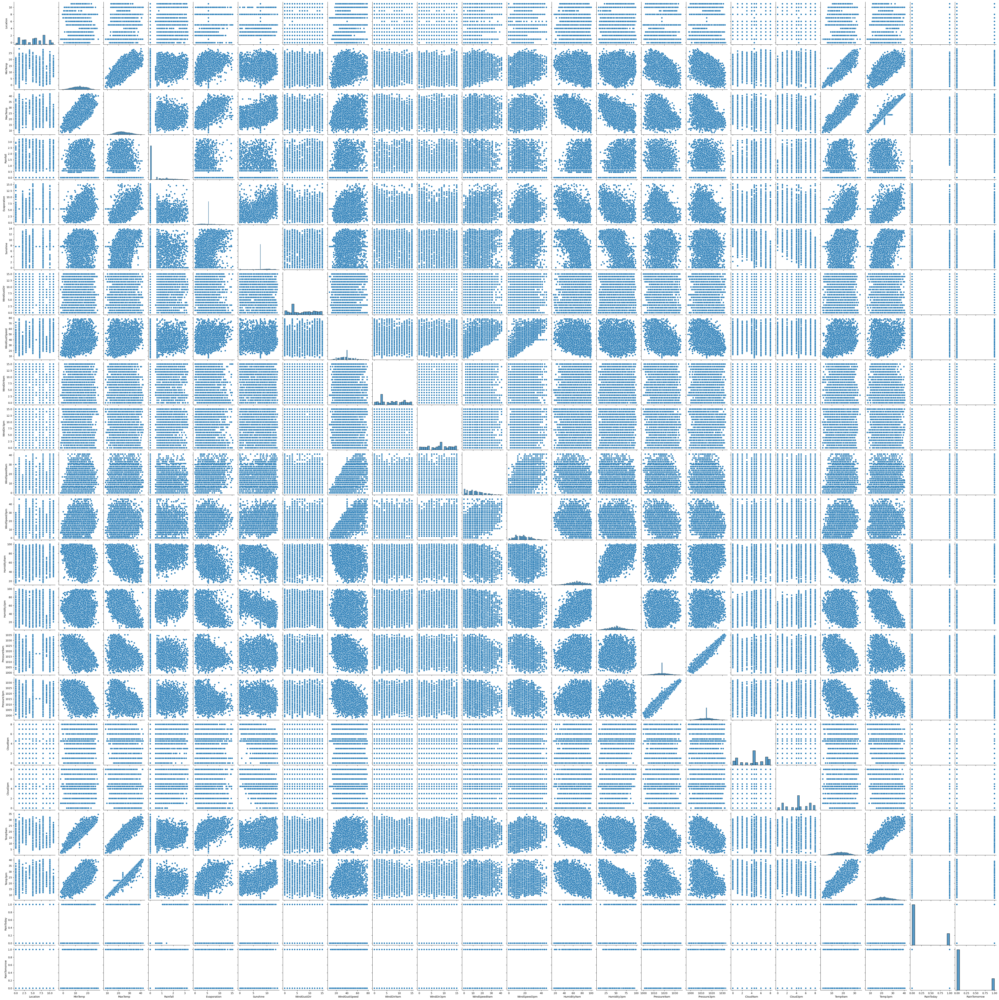

In [65]:
# Pairplot for pairwise relationships
sns.pairplot(df)
plt.show()

In [26]:
#Encoding categorical columns using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes =='object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


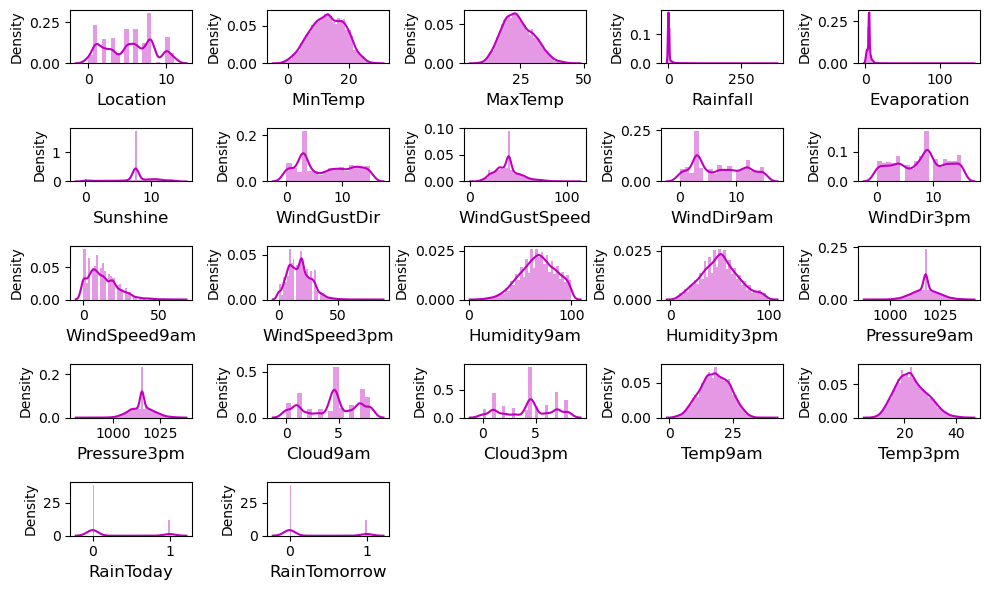

In [27]:
#To check data that have been distributed in remaining column
plt.figure(figsize = (10,6), facecolor = "white")
plotnumber = 1
for col in df:
    if plotnumber<=22:
        ax = plt.subplot(5,5,plotnumber)
        sns.distplot(df[col],color = "m")
        plt.xlabel(col,fontsize = 12)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()

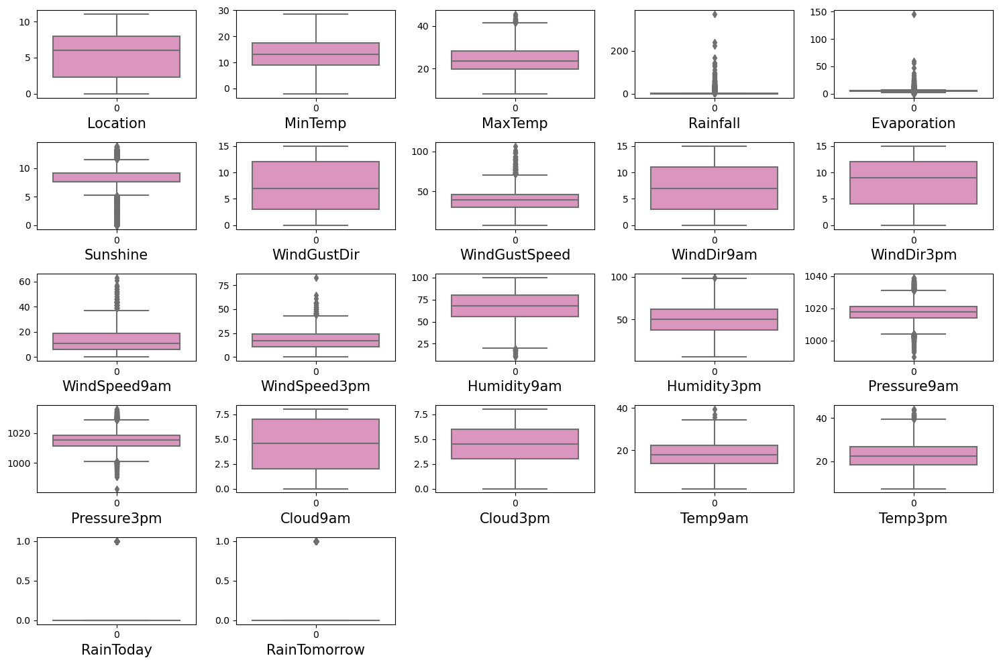

In [28]:
# checking for outliers by plotting boxplot
plt.figure(figsize = (15,10),facecolor ='white')
plotnumber = 1
for col in df:
    if plotnumber<=22:
        ax = plt.subplot(5,5,plotnumber)
        sns.boxplot(df[col],palette = "Set2_r")
        plt.xlabel(col,fontsize = 15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()

Most columns have outliers so we will try to remove using zscore method

In [29]:
# Remove outliers using the zscore method
from scipy.stats import zscore
z_scores = np.abs(zscore(df))
z_scores


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.395097,0.052341,0.195170,0.208040,0.014779,0.049294,1.246744,0.362850,1.315650,1.372365,...,0.203179,1.539598,1.647292,1.347736,1.453517,0.056332,0.173722,0.151545,0.550355,0.550355
1,1.395097,1.030640,0.163738,0.265281,0.014779,0.049294,1.455523,0.362850,0.222688,1.595253,...,1.368283,1.377411,1.166162,1.230431,0.067188,0.056332,0.121292,0.267112,0.550355,0.550355
2,1.395097,0.037907,0.261622,0.265281,0.014779,0.049294,1.664301,0.512305,1.315650,1.595253,...,1.717496,1.107100,1.663883,1.079611,0.067188,1.020514,0.542811,0.082903,0.550355,0.550355
3,1.395097,0.705746,0.636844,0.265281,0.014779,0.049294,0.632264,1.131708,0.436600,1.748064,...,1.310080,1.863971,0.004812,0.392542,0.067188,0.056332,0.035995,0.635529,0.550355,0.550355
4,1.395097,0.792378,1.338345,0.169879,0.014779,0.049294,1.246744,0.138666,1.321500,0.187849,...,0.843405,0.944913,1.132980,1.532071,1.049737,1.560632,0.016434,1.171410,0.550355,0.550355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.186193,1.860925,0.113600,0.265281,0.014779,0.049294,1.467379,0.608613,0.436600,1.525176,...,0.960867,1.431473,1.156538,0.864293,0.067188,0.056332,1.362117,0.051067,0.550355,0.550355
8421,1.186193,1.716528,0.196366,0.265281,0.014779,0.049294,0.214707,1.281164,0.436600,1.079401,...,0.669855,1.593660,0.974040,0.663199,0.067188,0.056332,1.222306,0.300604,0.550355,0.550355
8422,1.186193,1.391634,0.457390,0.265281,0.014779,0.049294,0.841043,0.160246,0.436600,1.372365,...,0.844462,1.431473,0.559272,0.277770,0.067188,0.056332,0.942683,0.568544,0.550355,0.550355
8423,1.186193,0.958441,0.473704,0.265281,0.014779,0.049294,0.411629,0.832796,0.656363,1.079401,...,0.960867,1.431473,0.293821,0.227497,0.565382,1.020514,0.488297,0.551798,0.550355,0.550355


In [30]:
# Set the threshold for what constitutes an outlier
threshold = 3

# Identify rows where any value in the row exceeds the threshold
outliers = (z_scores > threshold).any(axis=1)

# Filter the DataFrame to remove outliers
df = df[~outliers]

# Display the cleaned DataFrame
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.0,13.4,22.900000,0.6,5.389395,7.632205,13.0,44.000000,13.0,14.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0
1,1.0,7.4,25.100000,0.0,5.389395,7.632205,14.0,44.000000,6.0,15.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0
2,1.0,12.9,25.700000,0.0,5.389395,7.632205,15.0,46.000000,13.0,15.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0
3,1.0,9.2,28.000000,0.0,5.389395,7.632205,4.0,24.000000,9.0,0.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0
4,1.0,17.5,32.300000,1.0,5.389395,7.632205,13.0,41.000000,1.0,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,5.389395,7.632205,0.0,31.000000,9.0,1.0,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0
8421,9.0,3.6,25.300000,0.0,5.389395,7.632205,6.0,22.000000,9.0,3.0,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0
8422,9.0,5.4,26.900000,0.0,5.389395,7.632205,3.0,37.000000,9.0,14.0,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0
8423,9.0,7.8,27.000000,0.0,5.389395,7.632205,9.0,28.000000,10.0,3.0,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0


In [31]:
#checking for skewness
df.skew()


Location         0.004558
MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         3.514866
Evaporation      0.666495
Sunshine        -0.747742
WindGustDir      0.178714
WindGustSpeed    0.434313
WindDir9am       0.210848
WindDir3pm      -0.128886
WindSpeed9am     0.673887
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
RainToday        1.331440
RainTomorrow     1.330358
dtype: float64

In [32]:
#removing skewness using cuberoot method
df['Rainfall'] = np.cbrt(df['Rainfall'])

In [33]:
#checking for skewness again
df.skew()


Location         0.004558
MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         1.389792
Evaporation      0.666495
Sunshine        -0.747742
WindGustDir      0.178714
WindGustSpeed    0.434313
WindDir9am       0.210848
WindDir3pm      -0.128886
WindSpeed9am     0.673887
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
RainToday        1.331440
RainTomorrow     1.330358
dtype: float64

In [34]:
#Checking Correlation between the target and independent variables
cor = df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.091472,0.073476,0.014808,0.129580,0.057960,-0.074386,0.278172,-0.102857,-0.000346,...,-0.033315,-0.000235,-0.031874,-0.016914,-0.009118,-0.008124,0.098645,0.069616,-0.004653,0.000418
MinTemp,0.091472,1.000000,0.730197,0.090473,0.361394,0.054031,-0.156466,0.243404,-0.021378,-0.143699,...,-0.149335,0.078433,-0.447361,-0.448220,0.087362,0.038108,0.892858,0.699266,0.072717,0.093236
MaxTemp,0.073476,0.730197,1.000000,-0.229321,0.471183,0.363969,-0.224821,0.169838,-0.193261,-0.165585,...,-0.415637,-0.417903,-0.349021,-0.426730,-0.242385,-0.241603,0.865385,0.975024,-0.219629,-0.158441
Rainfall,0.014808,0.090473,-0.229321,1.000000,-0.189341,-0.274634,0.125915,0.092978,0.153835,0.108358,...,0.417103,0.397492,-0.126114,-0.046247,0.315178,0.269194,-0.090586,-0.241261,0.876318,0.336369
Evaporation,0.129580,0.361394,0.471183,-0.189341,1.000000,0.394608,-0.142669,0.220245,-0.139321,-0.024846,...,-0.336263,-0.254006,-0.284980,-0.304796,-0.116351,-0.163767,0.423022,0.459891,-0.177660,-0.108482
Sunshine,0.057960,0.054031,0.363969,-0.274634,0.394608,1.000000,-0.103315,0.045034,-0.075356,-0.055591,...,-0.391657,-0.440150,-0.028217,-0.086810,-0.544431,-0.564944,0.253612,0.381668,-0.238386,-0.334689
WindGustDir,-0.074386,-0.156466,-0.224821,0.125915,-0.142669,-0.103315,1.000000,-0.010865,0.386957,0.503272,...,0.035186,0.040636,-0.095646,-0.011860,0.119399,0.084497,-0.175939,-0.235985,0.118631,0.038153
WindGustSpeed,0.278172,0.243404,0.169838,0.092978,0.220245,0.045034,-0.010865,1.000000,-0.074751,0.090649,...,-0.267617,-0.098736,-0.362557,-0.327705,-0.007896,0.030581,0.223257,0.138323,0.077139,0.163416
WindDir9am,-0.102857,-0.021378,-0.193261,0.153835,-0.139321,-0.075356,0.386957,-0.074751,1.000000,0.207631,...,-0.000659,0.119977,-0.021884,0.056991,0.070784,0.054446,-0.066889,-0.201804,0.149524,0.034901
WindDir3pm,-0.000346,-0.143699,-0.165585,0.108358,-0.024846,-0.055591,0.503272,0.090649,0.207631,1.000000,...,-0.004414,-0.012045,-0.130442,-0.040749,0.071769,0.050200,-0.150590,-0.176952,0.095603,-0.000224


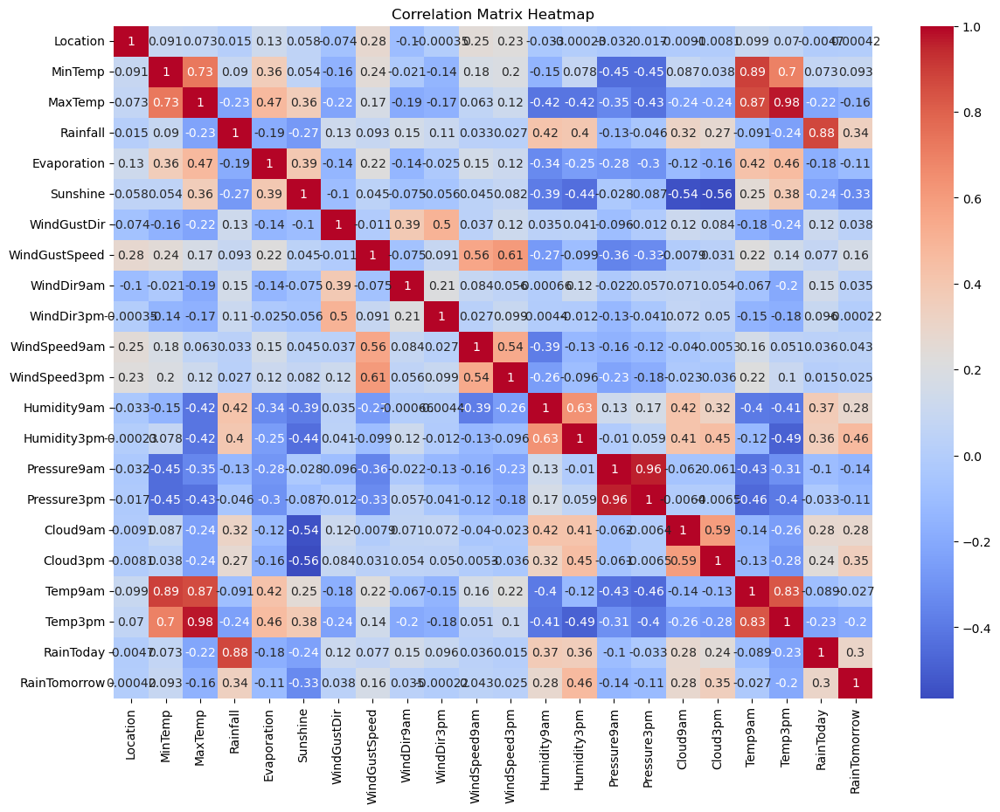

In [35]:
# Visualize the correlation matrix between the dependent and independent variables using a heatmap
plt.figure(figsize=(14,10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()


Model Building Using machine learning algorithms

Predicting when or not it would rain tomorrow (it is a binary classification problem)

In [62]:
#importing the necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report,mean_squared_error,r2_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [40]:
# Split the dataset into features and target variable
X = df.drop('RainTomorrow', axis=1)
y = df['RainTomorrow']

In [41]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
# Standardize the feature variables
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [43]:
# Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print(classification_report(y_test, y_pred_log_reg))

Logistic Regression Accuracy: 0.8455538221528861
              precision    recall  f1-score   support

         0.0       0.87      0.94      0.91      1009
         1.0       0.70      0.48      0.57       273

    accuracy                           0.85      1282
   macro avg       0.78      0.71      0.74      1282
weighted avg       0.83      0.85      0.83      1282



In [44]:
# Decision Tree
dt_clf = DecisionTreeClassifier()
dt_clf.fit(X_train, y_train)
y_pred_dt = dt_clf.predict(X_test)
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))
print(classification_report(y_test, y_pred_dt))

Decision Tree Accuracy: 0.7925117004680188
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87      1009
         1.0       0.51      0.50      0.51       273

    accuracy                           0.79      1282
   macro avg       0.69      0.69      0.69      1282
weighted avg       0.79      0.79      0.79      1282



In [45]:
# Random Forest
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.8549141965678627
              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91      1009
         1.0       0.75      0.47      0.58       273

    accuracy                           0.85      1282
   macro avg       0.81      0.72      0.75      1282
weighted avg       0.85      0.85      0.84      1282



In [46]:
# Gradient Boosting
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_clf.fit(X_train, y_train)
y_pred_gb = gb_clf.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, y_pred_gb))
print(classification_report(y_test, y_pred_gb))

Gradient Boosting Accuracy: 0.8525741029641186
              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91      1009
         1.0       0.74      0.48      0.58       273

    accuracy                           0.85      1282
   macro avg       0.80      0.72      0.75      1282
weighted avg       0.84      0.85      0.84      1282



In [47]:
from sklearn.svm import SVC

# Train SVM model
svm_clf = SVC()
svm_clf.fit(X_train, y_train)

# Make predictions
y_pred_svm = svm_clf.predict(X_test)

# Evaluate the model
print("Support Vector Machine")
print("Accuracy:", accuracy_score(y_test, y_pred_svm))
print(classification_report(y_test, y_pred_svm))

Support Vector Machine
Accuracy: 0.8549141965678627
              precision    recall  f1-score   support

         0.0       0.86      0.97      0.91      1009
         1.0       0.79      0.44      0.56       273

    accuracy                           0.85      1282
   macro avg       0.83      0.70      0.74      1282
weighted avg       0.85      0.85      0.84      1282



In [48]:
from sklearn.neural_network import MLPClassifier

# Train Neural Network model
mlp_clf = MLPClassifier(max_iter=1000)
mlp_clf.fit(X_train, y_train)

# Make predictions
y_pred_mlp = mlp_clf.predict(X_test)

# Evaluate the model
print("Neural Network")
print("Accuracy:", accuracy_score(y_test, y_pred_mlp))
print(classification_report(y_test, y_pred_mlp))

Neural Network
Accuracy: 0.8307332293291732
              precision    recall  f1-score   support

         0.0       0.87      0.92      0.90      1009
         1.0       0.63      0.50      0.56       273

    accuracy                           0.83      1282
   macro avg       0.75      0.71      0.73      1282
weighted avg       0.82      0.83      0.82      1282



The best model is Random Forest because it has the highest accuracy score: 0.8549141965678627
Hyperparameter Tuning on the best model - Random Forest

In [51]:
rf = RandomForestClassifier(random_state=42)
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],        # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],         # Maximum depth of the trees
    'min_samples_split': [2, 5, 10],         # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],           # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'] # Number of features to consider when looking for the best split
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Best accuracy score: {grid_search.best_score_}')

# Predict with the best estimator
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)  # Only for regression tasks

print(f'Accuracy: {accuracy}')
print(f'Mean Squared Error: {mse}')  # Only for regression tasks

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters found: {'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Best accuracy score: 0.8445475205629249
Accuracy: 0.858814352574103
Mean Squared Error: 0.14118564742589704


Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.(Regression problem)

In [52]:
# Split the dataset into features and target variable
X = df.drop('Rainfall', axis=1)
y = df['Rainfall']

In [53]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [58]:
# Create the model
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate Mean Squared Error and R²
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'RandomForestRegressor -Mean Squared Error: {mse}')
print(f'R²: {r2}')

RandomForestRegressor -Mean Squared Error: 0.1284860322499109
R²: 0.7934314006388397


In [63]:
# Initialize and train different regression models

# Linear Regression
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)
y_pred_linear = linear_reg.predict(X_test)

# Decision Tree Regression
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train, y_train)
y_pred_tree = tree_reg.predict(X_test)

# Gradient Boosting Regression
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train)
y_pred_gbr = gbr.predict(X_test)

# Calculate R-squared and Mean Squared Error for each model

# Linear Regression
mse_linear = mean_squared_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)
print(f'Linear Regression - MSE: {mse_linear}, R2: {r2_linear}')

# Decision Tree Regression
mse_tree = mean_squared_error(y_test, y_pred_tree)
r2_tree = r2_score(y_test, y_pred_tree)
print(f'Decision Tree Regression - MSE: {mse_tree}, R2: {r2_tree}')

# Gradient Boosting Regression
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)
print(f'Gradient Boosting Regression - MSE: {mse_gbr}, R2: {r2_gbr}')

Linear Regression - MSE: 0.1339238842947496, R2: 0.7846888979654696
Decision Tree Regression - MSE: 0.2538005302501947, R2: 0.5919617165161632
Gradient Boosting Regression - MSE: 0.12516189514212459, R2: 0.7987756573990165


Conclusion Best Model: Gradient Boosting Regression MSE: 0.12516189514212459 R²: R2: 0.7987756573990165.
It has the lowest MSE and the highest R², making it the best performing model among the ones tested.

In [64]:
#Hyperparameter tuning on Gradient Boosting Regressor
# Initialize the GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],          # Number of boosting stages to be run
    'learning_rate': [0.01, 0.1, 0.2],        # Learning rate
    'max_depth': [3, 4, 5],                   # Maximum depth of the individual regression estimators
    'min_samples_split': [2, 5, 10],          # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],            # Minimum number of samples required to be at a leaf node
    'subsample': [0.8, 0.9, 1.0]              # Fraction of samples to be used for fitting the individual base learners
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=5, verbose=2, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Best score (neg_mean_squared_error): {grid_search.best_score_}')

# Predict with the best estimator
best_gbr = grid_search.best_estimator_
y_pred = best_gbr.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Fitting 5 folds for each of 729 candidates, totalling 3645 fits
Best parameters found: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.9}
Best score (neg_mean_squared_error): -0.13525640033424396
Mean Squared Error: 0.12212924477270588
R-squared: 0.803651287288065
